In [1]:
import requests
from bs4 import BeautifulSoup
import pandas as pd

In [200]:
url = 'https://www.inven.co.kr/board/maple/2299?p=1000'
res = requests.get(url)
html_str = res.text
soup = BeautifulSoup(html_str, 'html.parser')
soup

<!DOCTYPE html>

<html lang="ko">
<head>
<meta content="text/html; charset=utf-8" http-equiv="content-type"/>
<meta content="IE=EDGE" http-equiv="X-UA-Compatible"/>
<meta content="메이플스토리,메이플,maple story,maple,메이플스토리 인벤,메이플 인벤,메벤,아크,일리움,제로,히어로,레지스탕스,모험가,시그너스 기사단,영웅,노바,메이플스토리 인벤 자유게시판" name="keywords"/>
<meta content="메이플스토리 뉴스, 가이드, 직업/스킬, 아이템, 몬스터, 추천사냥터, 제작, 퀘스트, 커뮤니티" name="description"/>
<meta content="3a508505e9bf09f6b8b7abe782e34f3cc895eb65" name="naver-site-verification"/>
<meta content="maple" name="inven-site"/>
<meta content="메이플스토리" name="inven-sitename"/>
<meta content="ddba5d44-237c-4b01-855f-95c23caa9082" name="adshield-analytics-verification"/>
<meta content="메이플스토리 뉴스, 가이드, 직업/스킬, 아이템, 몬스터, 추천사냥터, 제작, 퀘스트, 커뮤니티" property="og:description"/>
<meta content="board" name="inven-feedtype"/>
<meta content="메이플스토리 인벤 자유게시판 - 메이플스토리 인벤" property="og:title"/>
<meta content="메이플스토리 인벤 자유게시판 - 메이플스토리 인벤" name="title"/>
<meta content="website" property="og:type"/>
<meta content="메이플스

In [47]:
soup.select('div.board-list')[0].select('tr')[1]

<tr class="">
<td class="num">
<span>8665310</span>
</td>
<td class="tit">
<div class="text-wrap">
<div>
<span class="user-icon"><img alt="유저 아이콘" src="https://upload2.inven.co.kr/upload/2016/06/25/icon/i12634664967.jpg"/></span> <a class="subject-link" href="https://www.inven.co.kr/board/maple/2299/8665310?p=1000">
<span class="category">[수다]</span>
                                                                                                            그란디스 다음에 이계 내자                                </a>
</div>
<span class="con-comment" data-opinion-bbs-comeidx="2299" data-opinion-bbs-uid="8665310">[6]</span> <span class="con-icon board-img photo">사진</span> </div>
</td>
<td class="user">
<img alt="레벨 아이콘" src="https://static.inven.co.kr/image_2011/member/level/1202/lv73.gif"/>
<span class="layerNickName" onclick="layerNickName('자연인애청자', 'pbNickNameHandler'); ">자연인애청자</span> </td>
<td class="date">02-23</td>
<td class="view">179</td>
<td class="reco">0</td>
</tr>

In [57]:
soup.select('div.board-list')[0].select('tr')[5].select_one('a').get('href')

'https://www.inven.co.kr/board/maple/2299/8726983'

In [2]:
def inven(start=1, end=1):
    content_list = []
    community = 1
    for i in range(start, end+1):
        print('Page ' + str(i) + ': ', end='')
        url = 'https://www.inven.co.kr/board/maple/2299?p='+str(i)
        res = requests.get(url)
        html_str = res.text
        soup = BeautifulSoup(html_str, 'html.parser')
        tr_list = soup.select('div.board-list')[0].select('tr')
        j = 0
        for tr in tr_list:
            if j >= 1 and tr.select('span')[0].text != '공지':
                print('*', end='')
                num = tr.select('span')[0].text
                title = tr.select('a')[0].text.replace('\n[수다]\n','').replace('\n[웃긴글]\n','').lstrip(' ').rstrip(' ')
                try:
                    comments = int(tr.select_one('span.con-comment').text.replace('[','').replace(']','').replace(',',''))
                except:
                    comments = 0
                views = int(tr.select_one('td.view').text.replace(',',''))
                likes = int(tr.select_one('td.reco').text.replace(',',''))
                date = str(tr.select_one('td.date').text)
                url = tr.select_one('a').get('href')

                content_list.append([comunity, num, title, comments, views, likes, date, url])
                
            j += 1
        print('')
    df_contents = pd.DataFrame(content_list, columns = ['community', 'num', 'title', 'comments', 'views', 'likes', 'date', 'url'])

    return df_contents


In [3]:
inven = inven(start=1, end=510)

Page 1: **************************************************
Page 2: **************************************************
Page 3: **************************************************
Page 4: **************************************************
Page 5: **************************************************
Page 6: **************************************************
Page 7: **************************************************
Page 8: **************************************************
Page 9: **************************************************
Page 10: **************************************************
Page 11: **************************************************
Page 12: **************************************************
Page 13: **************************************************
Page 14: **************************************************
Page 15: **************************************************
Page 16: **************************************************
Page 17: ****************************************

Page 272: **************************************************
Page 273: **************************************************
Page 274: **************************************************
Page 275: **************************************************
Page 276: **************************************************
Page 277: **************************************************
Page 278: **************************************************
Page 279: **************************************************
Page 280: **************************************************
Page 281: **************************************************
Page 282: **************************************************
Page 283: **************************************************
Page 284: **************************************************
Page 285: **************************************************
Page 286: **************************************************
Page 287: **************************************************
Page 288: **************

Page 407: **************************************************
Page 408: **************************************************
Page 409: **************************************************
Page 410: **************************************************
Page 411: **************************************************
Page 412: **************************************************
Page 413: **************************************************
Page 414: **************************************************
Page 415: **************************************************
Page 416: **************************************************
Page 417: **************************************************
Page 418: **************************************************
Page 419: **************************************************
Page 420: **************************************************
Page 421: **************************************************
Page 422: **************************************************
Page 423: **************

In [4]:
inven

,comunity,num,title,comments,views,likes,date,url
0,1,8742919,아 진짜 여시한테 왜 그래,0,9,0,10:03,https://www.inven.co.kr/board/maple/2299/8742919
1,1,8742918,자가진단키트 써본 친구들있음?,1,23,0,10:02,https://www.inven.co.kr/board/maple/2299/8742918
2,1,8742917,이걸 하모니 코인이라고 불렀구나,0,57,0,10:02,https://www.inven.co.kr/board/maple/2299/8742917
3,1,8742916,스샷 박제후 인벤닉 저격하면 제재먹음?,2,25,0,10:01,https://www.inven.co.kr/board/maple/2299/8742916
4,1,8742915,메이플 컴플리트 가챠가 자석펫임?,1,33,0,10:01,https://www.inven.co.kr/board/maple/2299/8742915
...,...,...,...,...,...,...,...,...
25495,1,8742891,윤석열 당선인 주요공약,4,317,0,09:56,https://www.inven.co.kr/board/maple/2299/8742891
25496,1,8742890,오이갤 눈팅 개꿀잼이네,0,76,0,09:56,https://www.inven.co.kr/board/maple/2299/8742890
25497,1,8742889,윤통령 현충원 언제감?,1,99,0,09:56,https://www.inven.co.kr/board/maple/2299/8742889
25498,1,8742888,이딴ㄴ들한테 호소하니까 찰스표도 못가져오는거야,2,155,0,09:56,https://www.inven.co.kr/board/maple/2299/8742888


In [5]:
inven.to_csv('./inven_0310.csv', header=True, index=True)

In [2]:
inven_0308 = pd.read_csv('./inven_0308.csv')
inven_0310 = pd.read_csv('./inven_0310.csv')

In [3]:
inven = pd.concat([inven_0310, inven_0308])

In [4]:
inven.head()

,Unnamed: 0,community,num,title,comments,views,likes,date,url
0,0,1,8742919,아 진짜 여시한테 왜 그래,0,9,0,10:03,https://www.inven.co.kr/board/maple/2299/8742919
1,1,1,8742918,자가진단키트 써본 친구들있음?,1,23,0,10:02,https://www.inven.co.kr/board/maple/2299/8742918
2,2,1,8742917,이걸 하모니 코인이라고 불렀구나,0,57,0,10:02,https://www.inven.co.kr/board/maple/2299/8742917
3,3,1,8742916,스샷 박제후 인벤닉 저격하면 제재먹음?,2,25,0,10:01,https://www.inven.co.kr/board/maple/2299/8742916
4,4,1,8742915,메이플 컴플리트 가챠가 자석펫임?,1,33,0,10:01,https://www.inven.co.kr/board/maple/2299/8742915


In [5]:
inven.num.value_counts()

8730347    11
8730353    11
8730343    11
8730330    11
8730325    11
           ..
8740602     1
8732406     1
8741066     1
8736972     1
8734663     1
Name: num, Length: 35008, dtype: int64

In [5]:
inven1 = inven[['community', 'num', 'title', 'comments', 'views', 'likes', 'date', 'url']]

In [6]:
inven2 = inven1.drop_duplicates(['num'])

In [7]:
inven2

,community,num,title,comments,views,likes,date,url
0,1,8742919,아 진짜 여시한테 왜 그래,0,9,0,10:03,https://www.inven.co.kr/board/maple/2299/8742919
1,1,8742918,자가진단키트 써본 친구들있음?,1,23,0,10:02,https://www.inven.co.kr/board/maple/2299/8742918
2,1,8742917,이걸 하모니 코인이라고 불렀구나,0,57,0,10:02,https://www.inven.co.kr/board/maple/2299/8742917
3,1,8742916,스샷 박제후 인벤닉 저격하면 제재먹음?,2,25,0,10:01,https://www.inven.co.kr/board/maple/2299/8742916
4,1,8742915,메이플 컴플리트 가챠가 자석펫임?,1,33,0,10:01,https://www.inven.co.kr/board/maple/2299/8742915
...,...,...,...,...,...,...,...,...
25047,1,8698386,혹시 스타캐쳐경험치 계산법있나요?,0,215,0,03-01,https://www.inven.co.kr/board/maple/2299/86983...
25048,1,8698385,ㅈㄴㄱㅈ 1000이니 ㄹㅈㄱㄱ,8,136,0,03-01,https://www.inven.co.kr/board/maple/2299/86983...
25049,1,8698383,드메 60/100 국룰 세팅 어떻게 맞추나요??,9,354,0,03-01,https://www.inven.co.kr/board/maple/2299/86983...
25052,1,8730374,벌써 9시 반이네,0,1,0,13:22,https://www.inven.co.kr/board/maple/2299/8730374


In [8]:
inven2 = inven2.reset_index()

In [9]:
# inven3 = inven2.sort_values(by=['num'], axis=0, ascending=False)

In [10]:
# inven4 = inven3.reset_index()

In [11]:
# inven2[inven2.date=='00:00']

In [12]:
# inven2.loc[5049]

In [13]:
# inven2.loc[0:1606].date = '03-08'

In [14]:
# inven2.loc[1607:5048].date = '03-07'

In [15]:
# inven2[inven2['date'].str.contains(':')]

In [16]:
# inven2.loc[25050:].date = '03-08'

In [17]:
inven3 = inven2.drop(inven2[inven2['date'].str.contains(':')].index)

In [18]:
inven4 = inven3.drop(inven2[inven2['date']=='03-01'].index)

In [19]:
inven5 = inven4.reset_index()

In [20]:
inven5.drop(['level_0','index'], axis=1,inplace=True)

In [21]:
inven5

,community,num,title,comments,views,likes,date,url
0,1,8732844,문득 궁금해졌다,0,51,0,03-08,https://www.inven.co.kr/board/maple/2299/87328...
1,1,8732843,아무도 안올렸길래 올림.jpg,7,239,0,03-08,https://www.inven.co.kr/board/maple/2299/87328...
2,1,8732842,잭스,0,58,0,03-08,https://www.inven.co.kr/board/maple/2299/87328...
3,1,8732841,응 내일 투표 안해~,0,77,0,03-08,https://www.inven.co.kr/board/maple/2299/87328...
4,1,8732840,아니 4년전이랑 다르게 레벨 왜이리 올리기 쉬워짐,2,105,0,03-08,https://www.inven.co.kr/board/maple/2299/87328...
...,...,...,...,...,...,...,...,...
25363,1,8700215,방학에 할꺼 생각만 하고 있었는데,0,133,0,03-02,https://www.inven.co.kr/board/maple/2299/87002...
25364,1,8700213,시발 3월 2일이다,2,178,0,03-02,https://www.inven.co.kr/board/maple/2299/87002...
25365,1,8700214,파이널어택 패시브화 기원 13일차,0,172,0,03-02,https://www.inven.co.kr/board/maple/2299/87002...
25366,1,8700212,오늘은 상디의 생일입니다.,1,165,0,03-02,https://www.inven.co.kr/board/maple/2299/87002...


In [165]:
inven5.to_csv('./inven.csv', header=True, index=True)

In [22]:
import matplotlib.pyplot as plt

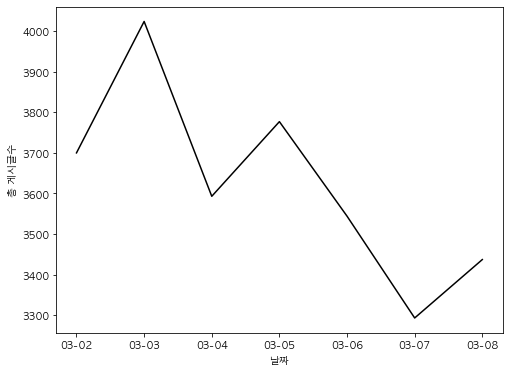

In [27]:
content_count = inven5.date.value_counts()

fig = plt.figure(figsize=(8,6))
ax1 = fig.add_subplot()

ax1.plot(content_count.index.sort_values(), content_count[content_count.index.sort_values()], color='#000000')
ax1.set_xlabel('날짜')
ax1.set_ylabel('총 게시글수')

plt.show()

In [38]:
grouped_date = inven5['date'].groupby(inven5['date'])
print('mean: ', grouped_date.size().values.mean())
print('max: ', grouped_date.size().values.max())
print('min: ', grouped_date.size().values.min())

mean:  3624.0
max:  4024
min:  3293


In [20]:
grouped_comm = inven5['comments'].groupby(inven5['date'])
print('size: ', grouped_comm.size(), end='\n\n')
print('sum:', grouped_comm.sum(), end='\n\n')
print('mean: ', grouped_comm.mean())

size:  date
03-02    3700
03-03    4024
03-04    3593
03-05    3777
03-06    3544
03-07    3293
03-08    3437
Name: comments, dtype: int64

sum: date
03-02    19040
03-03    17777
03-04    17474
03-05    18109
03-06    16482
03-07    18125
03-08    20222
Name: comments, dtype: int64

mean:  date
03-02    5.145946
03-03    4.417744
03-04    4.863345
03-05    4.794546
03-06    4.650677
03-07    5.504100
03-08    5.883619
Name: comments, dtype: float64


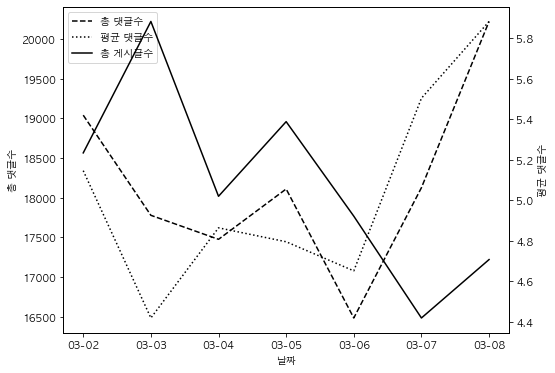

In [21]:
fig = plt.figure(figsize=(8,6))
ax1 = fig.add_subplot()

line1 = ax1.plot(grouped_comm.sum().index.sort_values(), 
         grouped_comm.sum()[grouped_comm.sum().index.sort_values()],
         color='#000000',
         linestyle='dashed', label='총 댓글수')
ax1.set_xlabel('날짜')
ax1.set_ylabel('총 댓글수')
ax1.tick_params(axis='y')


ax2 = ax1.twinx()
line2 = ax2.plot(grouped_comm.mean().index.sort_values(), 
         grouped_comm.mean()[grouped_comm.mean().index.sort_values()],
         color='#000000',
         linestyle='dotted', label='평균 댓글수')
ax2.set_ylabel('평균 댓글수')
ax2.tick_params(axis='y')


ax3 = ax1.twinx()
line3 = ax3.plot(content_count.index.sort_values(), 
         content_count[content_count.index.sort_values()], 
         color='#000000', label='총 게시글수')
ax3.yaxis.set_visible(False)

lines = line1 + line2 + line3
labels = [l.get_label() for l in lines]
ax1.legend(lines, labels, loc='upper left')

plt.show()

In [39]:
grouped_view = inven5['views'].groupby(inven5['date'])
print('size: ', grouped_view.size(), end='\n\n')
print('sum:', grouped_view.sum(), end='\n\n')
print('mean: ', grouped_view.mean())

size:  date
03-02    3700
03-03    4024
03-04    3593
03-05    3777
03-06    3544
03-07    3293
03-08    3437
Name: views, dtype: int64

sum: date
03-02    2869470
03-03    2816640
03-04    2220596
03-05    2592600
03-06    2494335
03-07    2845962
03-08    2700691
Name: views, dtype: int64

mean:  date
03-02    775.532432
03-03    699.960239
03-04    618.033955
03-05    686.417792
03-06    703.819131
03-07    864.245976
03-08    785.769857
Name: views, dtype: float64


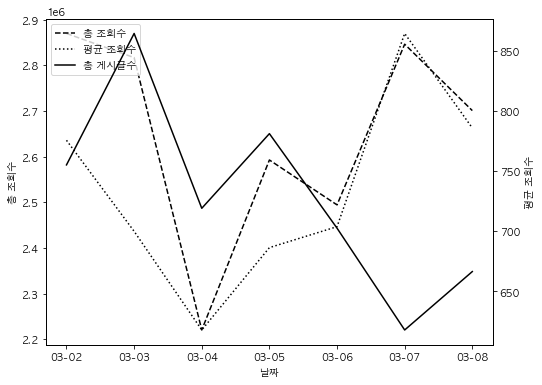

In [40]:
fig = plt.figure(figsize=(8,6))
ax1 = fig.add_subplot()

line1 = ax1.plot(grouped_view.sum().index.sort_values(), 
         grouped_view.sum()[grouped_view.sum().index.sort_values()],
         color='#000000',
         linestyle='dashed', label='총 조회수')
ax1.set_xlabel('날짜')
ax1.set_ylabel('총 조회수')
ax1.tick_params(axis='y')


ax2 = ax1.twinx()
line2 = ax2.plot(grouped_view.mean().index.sort_values(), 
         grouped_view.mean()[grouped_view.mean().index.sort_values()],
         color='#000000',
         linestyle='dotted', label='평균 조회수')
ax2.set_ylabel('평균 조회수')
ax2.tick_params(axis='y')


ax3 = ax1.twinx()
line3 = ax3.plot(content_count.index.sort_values(), 
         content_count[content_count.index.sort_values()], 
         color='#000000', label='총 게시글수')
ax3.yaxis.set_visible(False)

lines = line1 + line2 + line3
labels = [l.get_label() for l in lines]
ax1.legend(lines, labels, loc='upper left')

plt.show()

In [42]:
grouped_like = inven5['likes'].groupby(inven5['date'])
print('size: ', grouped_like.size(), end='\n\n')
print('sum:', grouped_like.sum(), end='\n\n')
print('mean: ', grouped_like.mean())

size:  date
03-02    3700
03-03    4024
03-04    3593
03-05    3777
03-06    3544
03-07    3293
03-08    3437
Name: likes, dtype: int64

sum: date
03-02     7094
03-03    11053
03-04     8132
03-05     8580
03-06     6161
03-07     7296
03-08     8396
Name: likes, dtype: int64

mean:  date
03-02    1.917297
03-03    2.746769
03-04    2.263290
03-05    2.271644
03-06    1.738431
03-07    2.215609
03-08    2.442828
Name: likes, dtype: float64


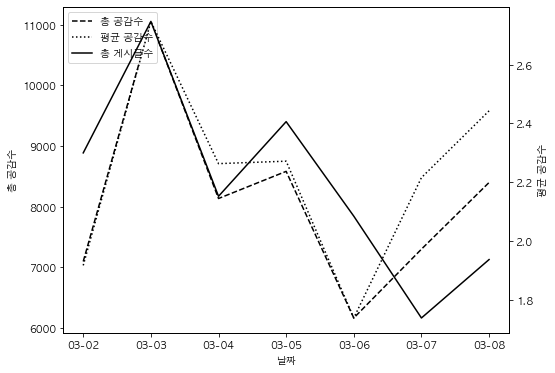

In [43]:
fig = plt.figure(figsize=(8,6))
ax1 = fig.add_subplot()

line1 = ax1.plot(grouped_like.sum().index.sort_values(), 
         grouped_like.sum()[grouped_like.sum().index.sort_values()],
         color='#000000',
         linestyle='dashed', label='총 공감수')
ax1.set_xlabel('날짜')
ax1.set_ylabel('총 공감수')
ax1.tick_params(axis='y')


ax2 = ax1.twinx()
line2 = ax2.plot(grouped_like.mean().index.sort_values(), 
         grouped_like.mean()[grouped_like.mean().index.sort_values()],
         color='#000000',
         linestyle='dotted', label='평균 공감수')
ax2.set_ylabel('평균 공감수')
ax2.tick_params(axis='y')


ax3 = ax1.twinx()
line3 = ax3.plot(content_count.index.sort_values(), 
         content_count[content_count.index.sort_values()], 
         color='#000000', label='총 게시글수')
ax3.yaxis.set_visible(False)

lines = line1 + line2 + line3
labels = [l.get_label() for l in lines]
ax1.legend(lines, labels, loc='upper left')

plt.show()

In [44]:
from wordcloud import WordCloud, STOPWORDS
from collections import Counter
from konlpy.tag import Okt
from PIL import Image
import numpy as np
from matplotlib import rc
%matplotlib inline

In [45]:
rc('font', family='AppleGothic')

plt.rcParams['axes.unicode_minus'] = False

In [46]:
okt = Okt()
nouns = okt.nouns(','.join(inven5.title.values))

In [47]:
words = [n for n in nouns if len(n) > 1]

In [48]:
c = Counter(words)

In [49]:
c.pop('메이플')

593

In [50]:
c.most_common(20)

[('사람', 755),
 ('진짜', 572),
 ('오이', 430),
 ('추천', 406),
 ('오늘', 388),
 ('헤어', 380),
 ('투표', 377),
 ('님들', 351),
 ('직업', 335),
 ('생각', 320),
 ('지금', 295),
 ('이유', 294),
 ('인벤', 275),
 ('질문', 273),
 ('코인', 267),
 ('이번', 263),
 ('요즘', 258),
 ('보스', 253),
 ('시드', 236),
 ('커믹', 228)]

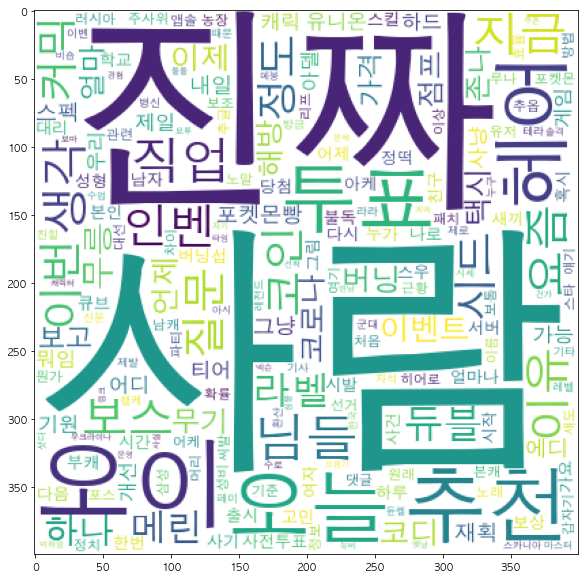

In [30]:
wc = WordCloud(font_path='AppleGothic', width=400, height=400, scale=1.0, max_font_size=250, background_color='#FFFFFF')
gen = wc.generate_from_frequencies(c)
plt.figure(figsize=(10,10))
plt.imshow(gen)
plt.show()

In [51]:
img = Image.open('mush.jpg')
img_array = np.array(img)

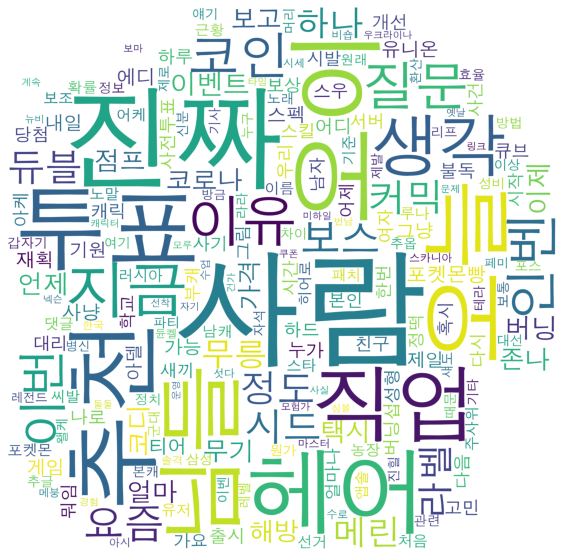

In [53]:
wc = WordCloud(font_path='AppleGothic', width=400, height=400, scale=3.0, max_font_size=250, mask=img_array, background_color='#FFFFFF')
gen = wc.generate_from_frequencies(c)
plt.figure(figsize=(10,10))
plt.imshow(gen)
plt.axis('off')
plt.show()

In [54]:
wc.to_file('./output/인벤_워드클라우드.png')

In [62]:
keywords_20 = []
freq_20 = []
for i in range(20):
    keywords_20.append(c.most_common(20)[i][0])
    freq_20.append(c.most_common(20)[i][1])

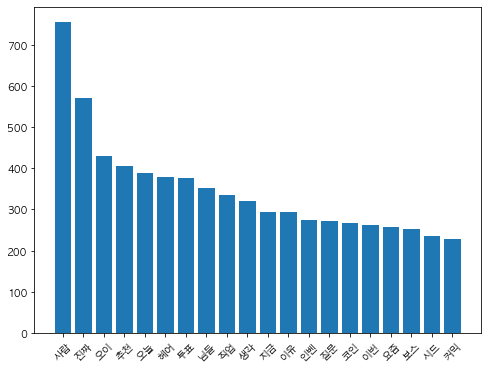

In [64]:
plt.figure(figsize=(8,6))
plt.bar(keywords_20, freq_20)
plt.xticks(rotation=45)
plt.show()

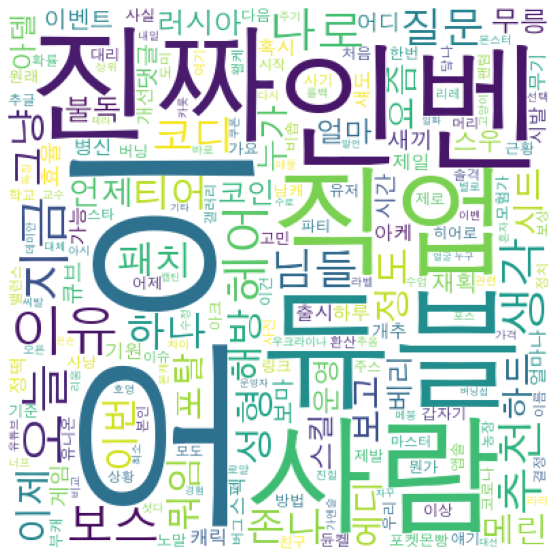

In [70]:
inven_33 = inven5.loc[inven5[inven5['date']=='03-03'].index]
nouns = okt.nouns(','.join(inven_33.title.values))
words = [n for n in nouns if len(n) > 1]
c1 = Counter(words)
try:
    c1.pop('메이플')
except:
    pass
wc = WordCloud(font_path='AppleGothic', width=400, height=400, scale=1.0, max_font_size=150, background_color='#FFFFFF')
gen = wc.generate_from_frequencies(c1)
plt.figure(figsize=(10,10))
plt.imshow(gen)
plt.axis('off')
plt.show()    

In [100]:
keywords_20_33 = []
freq_20_33 = []
for i in range(10):
    keywords_20_33.append(c1.most_common(20)[i][0])
    freq_20_33.append(c1.most_common(20)[i][1])

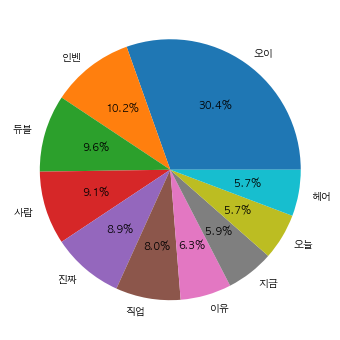

In [101]:
plt.figure(figsize=(8,6))
plt.pie(freq_20_33, labels=keywords_20_33, autopct='%.1f%%')
plt.show()

In [104]:
pd.DataFrame(inven_33.loc[inven_33[inven_33['title'].str.contains('사람')].index]['title'])

,title
17663,이니빵할사람 없나요오
17718,경기에서 대학 다니는 사람
17746,꼭 투표도 안했던 사람들이 제일 불만이 많고 말도 많았음
17826,걍 저사람들도 뭔죄인가 싶음
17882,교육학 해본사람?
...,...
21395,지금 실시간으로 ㅈ된 사람
21518,마격 때려준 사람들 이니 다 줬어
21581,꿀캠 쓰는사람들 있어??
21603,이글을 본사람은 마라벨 헤어쿠폰에 당첨됩니다


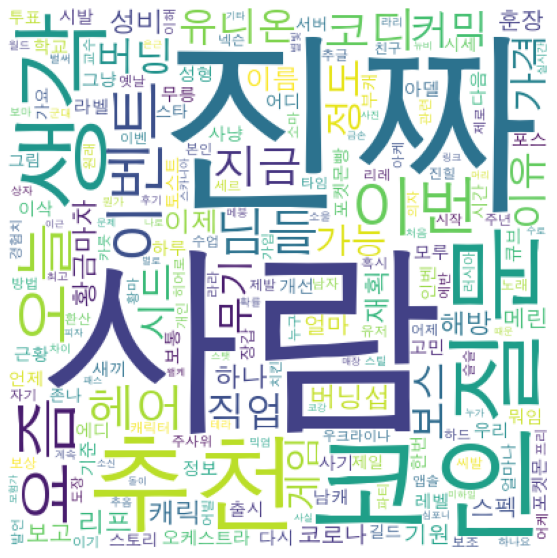

In [105]:
inven_37 = inven5.loc[inven5[inven5['date']=='03-07'].index]
nouns = okt.nouns(','.join(inven_37.title.values))
words = [n for n in nouns if len(n) > 1]
c1 = Counter(words)
try:
    c1.pop('메이플')
except:
    pass
wc = WordCloud(font_path='AppleGothic', width=400, height=400, scale=1.0, max_font_size=150, background_color='#FFFFFF')
gen = wc.generate_from_frequencies(c1)
plt.figure(figsize=(10,10))
plt.imshow(gen)
plt.axis('off')
plt.show()    

In [106]:
keywords_20_37 = []
freq_20_37 = []
for i in range(10):
    keywords_20_37.append(c1.most_common(20)[i][0])
    freq_20_37.append(c1.most_common(20)[i][1])

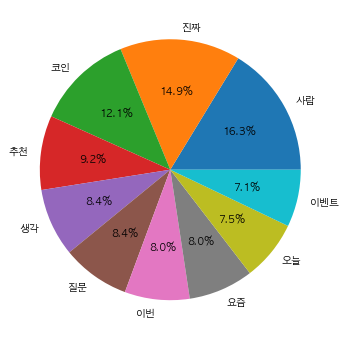

In [107]:
plt.figure(figsize=(8,6))
plt.pie(freq_20_37, labels=keywords_20_37, autopct='%.1f%%')
plt.show()

In [180]:
pd.DataFrame(inven_37.loc[inven_37[inven_37['title'].str.contains('코인')].index]['title'])

,title
3440,당분간 코인샵없음?
3492,후 코인이 부족해서 레잠 못사네..
3522,아... 목요일 리셋용 몬라 코인 남겨둿어야햇는데 ;;;;;
3539,코인샵으로 막상 살 것도 없는데도 계속 캐게 되네
3545,코인샾으로 돈벌고싶은데
...,...
6572,코인샵에서 구매한템 목록
6588,코인샵 수에큐 100코인인 거 뭔가 기괴하다
6600,멜로디코인 사용기한 얼마나됨?
6630,하모니코인막차 힘극추떴냐?


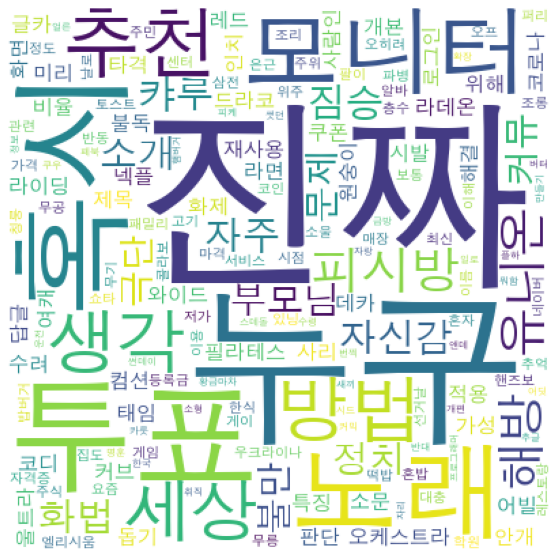

In [130]:
inven_37_1 = inven_37.loc[inven_37[inven_37['title'].str.contains('사람')].index]
nouns = okt.nouns(','.join(inven_37_1.title.values))
words = [n for n in nouns if len(n) > 1]
c1 = Counter(words)
try:
    c1.pop('메이플')
    c1.pop('사람')
except:
    pass
wc = WordCloud(font_path='AppleGothic', width=400, height=400, scale=1.0, max_font_size=150, background_color='#FFFFFF')
gen = wc.generate_from_frequencies(c1)
plt.figure(figsize=(10,10))
plt.imshow(gen)
plt.axis('off')
plt.show()    

In [131]:
keywords_20_37_1 = []
freq_20_37_1 = []
for i in range(20):
    keywords_20_37_1.append(c1.most_common(20)[i][0])
    freq_20_37_1.append(c1.most_common(20)[i][1])

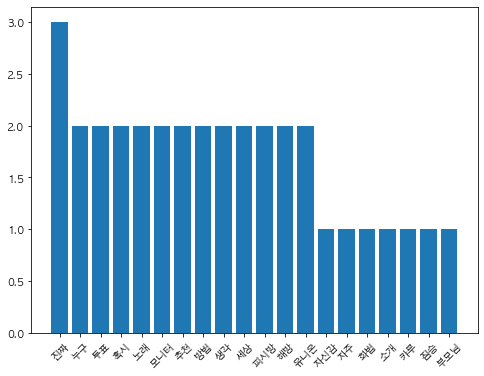

In [132]:
plt.figure(figsize=(8,6))
plt.bar(keywords_20_37_1, freq_20_37_1)
plt.xticks(rotation=45)
plt.show()

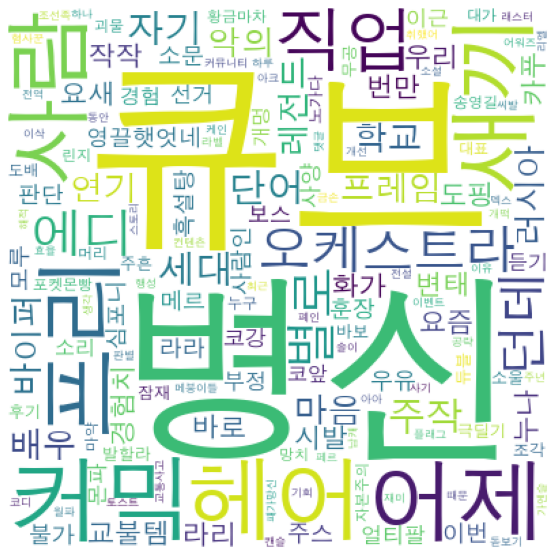

In [146]:
inven_37_2 = inven_37.loc[inven_37[inven_37['title'].str.contains('진짜')].index]
nouns = okt.nouns(','.join(inven_37_2.title.values))
words = [n for n in nouns if len(n) > 1]
c1 = Counter(words)
try:
    c1.pop('진짜')
    c1.pop('꼬츄')
except:
    pass
wc = WordCloud(font_path='AppleGothic', width=400, height=400, scale=1.0, max_font_size=150, background_color='#FFFFFF')
gen = wc.generate_from_frequencies(c1)
plt.figure(figsize=(10,10))
plt.imshow(gen)
plt.axis('off')
plt.show()    

In [147]:
keywords_20_37_2 = []
freq_20_37_2 = []
for i in range(20):
    keywords_20_37_2.append(c1.most_common(20)[i][0])
    freq_20_37_2.append(c1.most_common(20)[i][1])

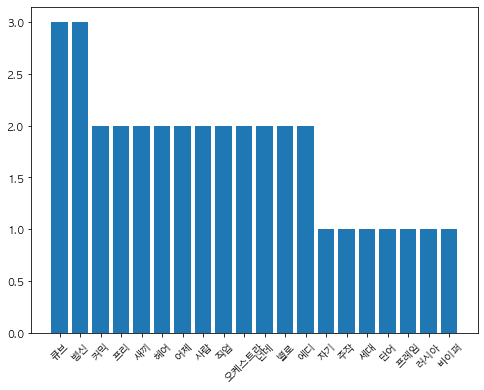

In [148]:
plt.figure(figsize=(8,6))
plt.bar(keywords_20_37_2, freq_20_37_2)
plt.xticks(rotation=45)
plt.show()

사람


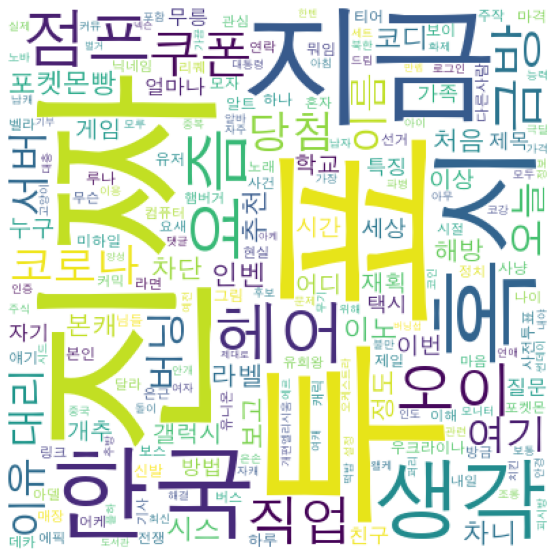

진짜


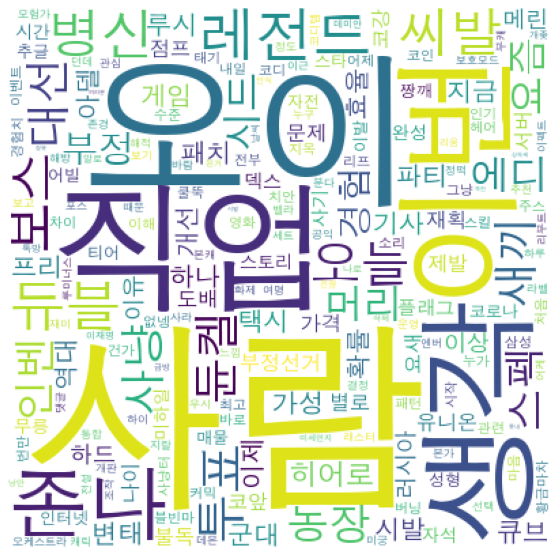

오이


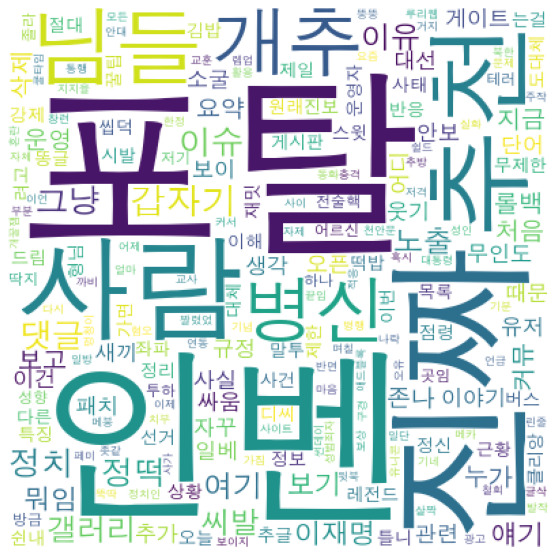

추천


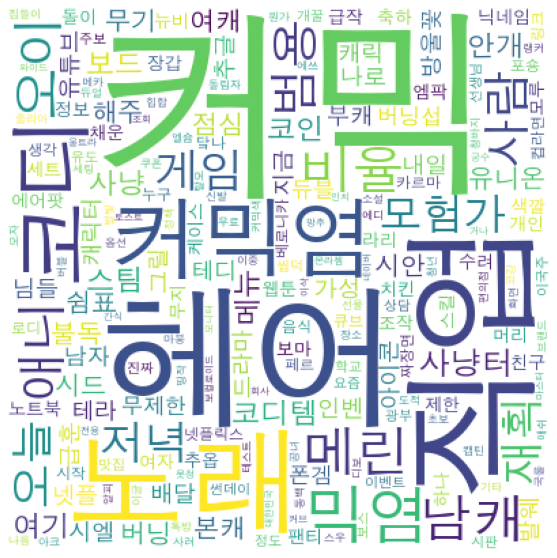

오늘


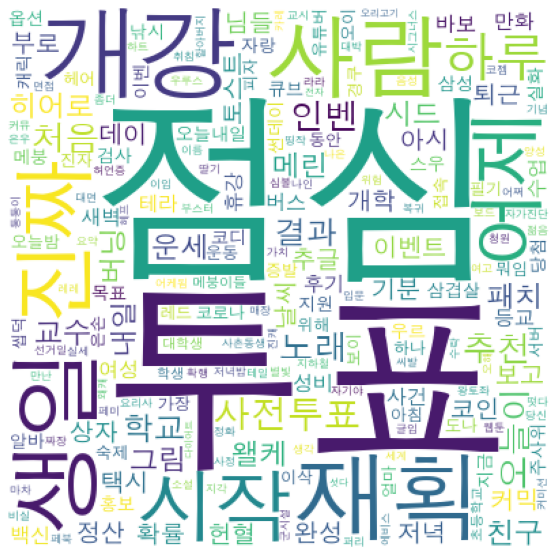

헤어


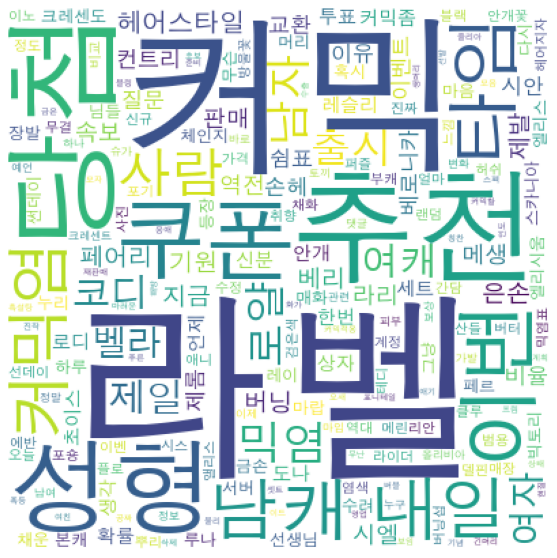

투표


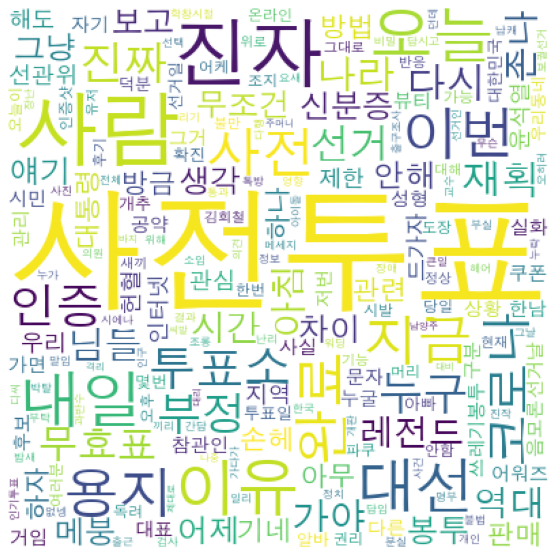

님들


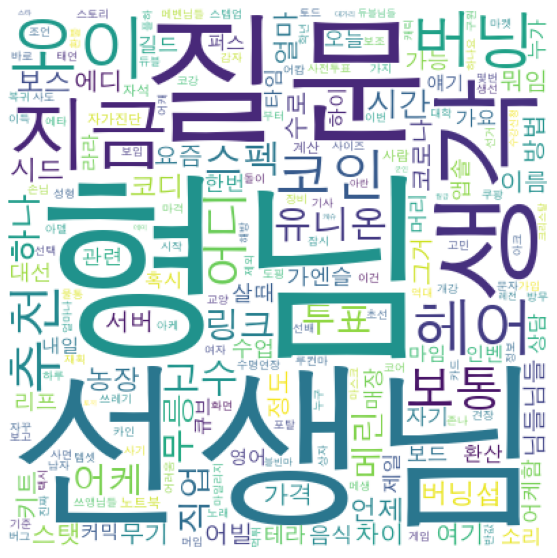

직업


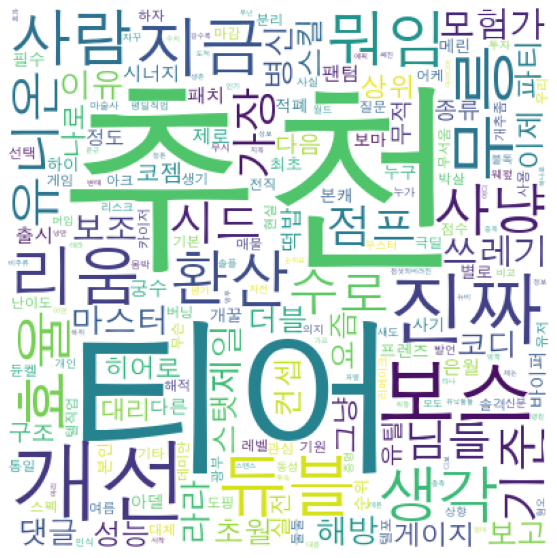

생각


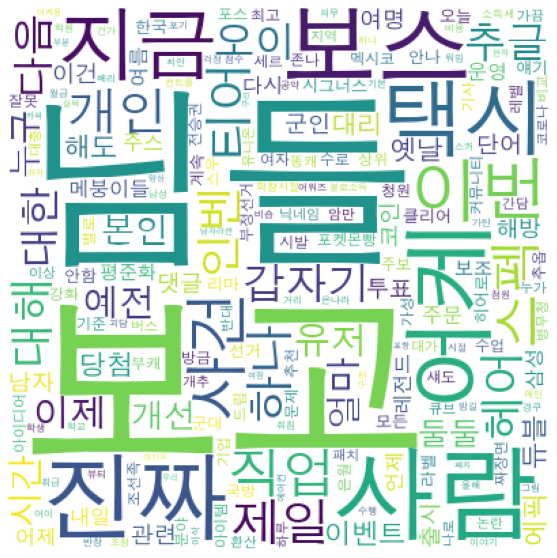

지금


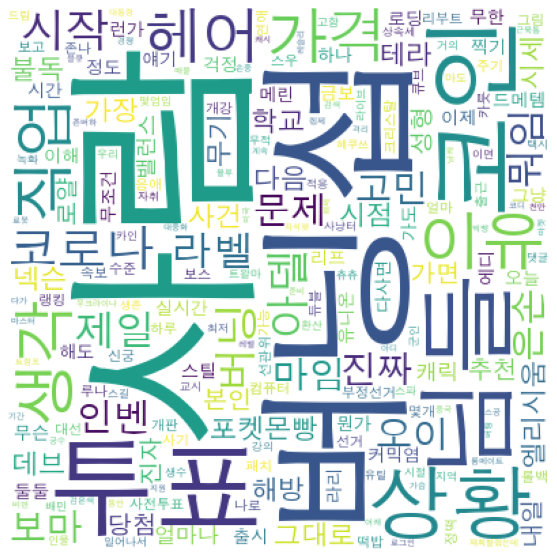

이유


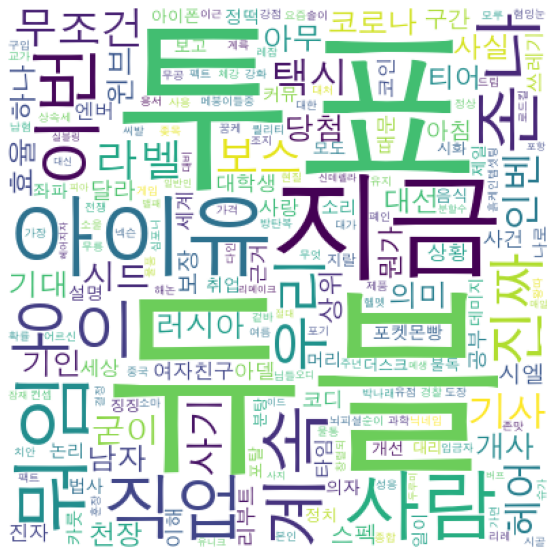

인벤


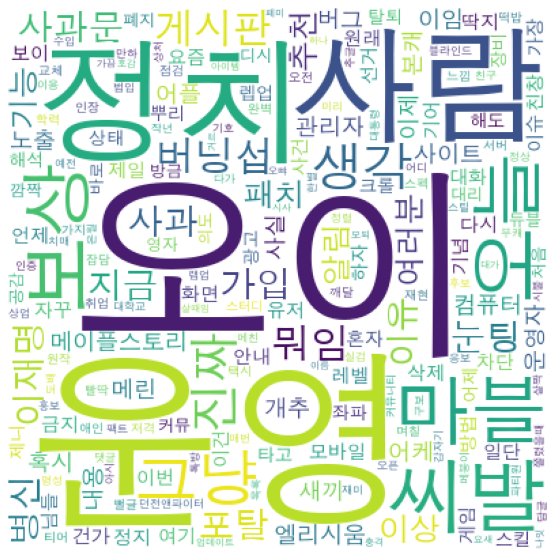

질문


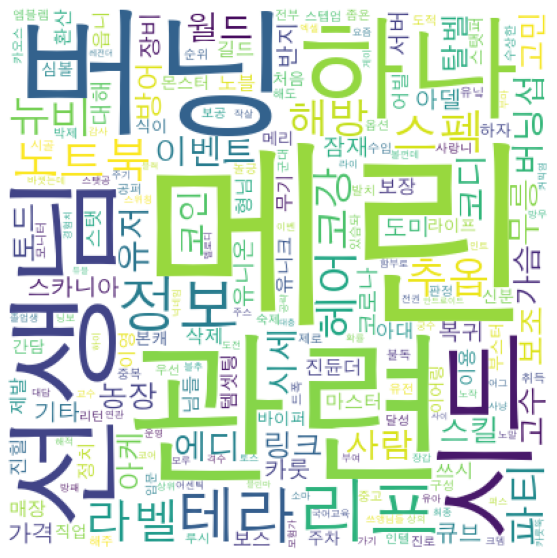

코인


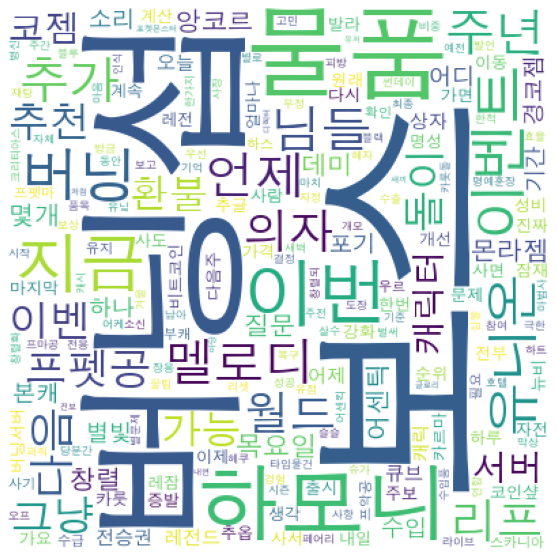

이번


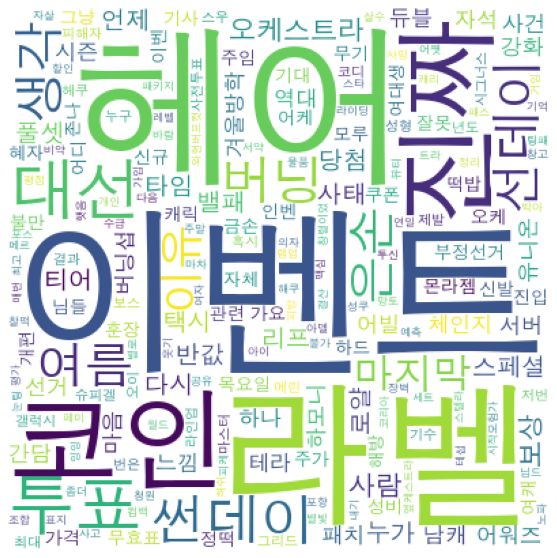

요즘


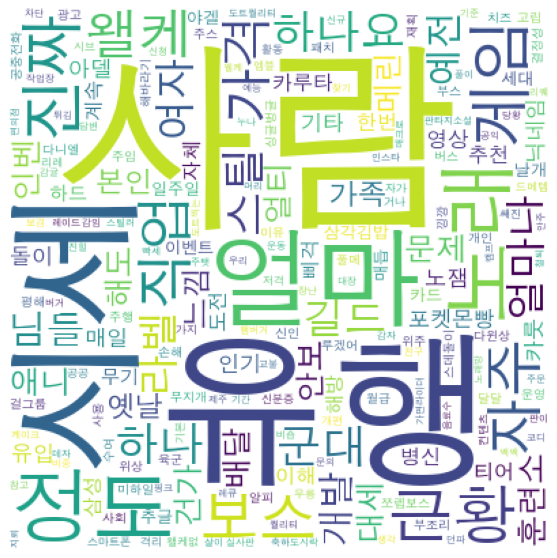

보스


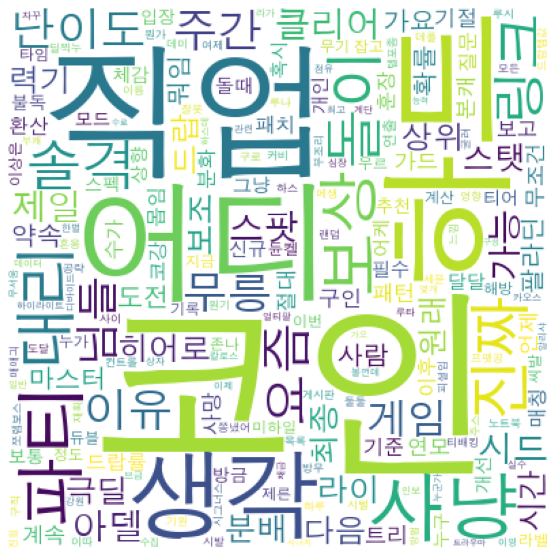

시드


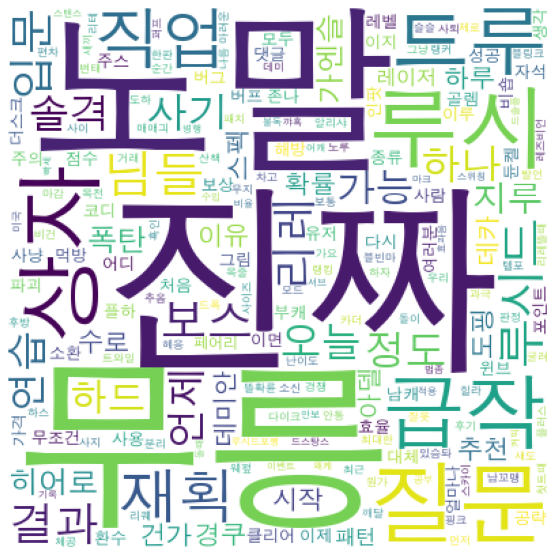

커믹


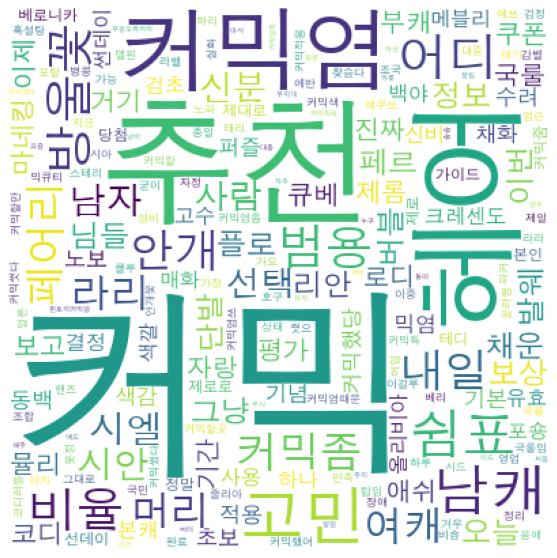

In [149]:
for i in range(20):
    print(c.most_common(20)[i][0])
    inven_top1 = inven5.loc[inven5[inven5['title'].str.contains(c.most_common(20)[i][0])].index]
    nouns = okt.nouns(','.join(inven_top1.title.values))
    words = [n for n in nouns if len(n) > 1]
    c1 = Counter(words)
    try:
        c1.pop('메이플')
        c1.pop(str(c.most_common(20)[i][0]))
    except:
        pass
    wc = WordCloud(font_path='AppleGothic', width=400, height=400, scale=1.0, max_font_size=150, background_color='#FFFFFF')
    gen = wc.generate_from_frequencies(c1)
    plt.figure(figsize=(10,10))
    plt.imshow(gen)
    plt.axis('off')
    plt.show()    
#     wc.to_file('./output/'+str(i+1)+'인벤_워드클라우드_'+c.most_common(20)[i][0]+'.png')

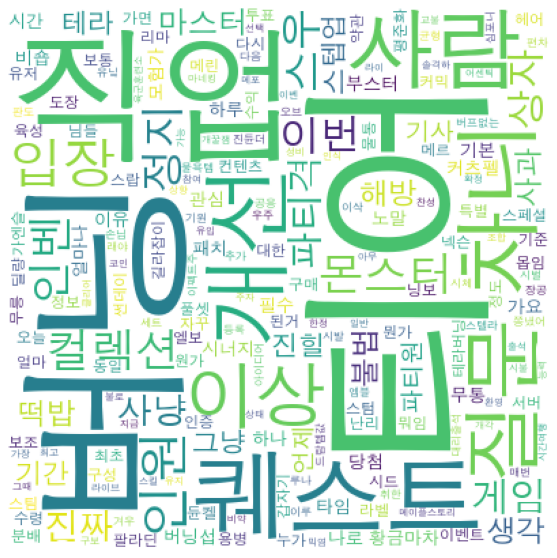

In [189]:
inven_top = inven5.loc[inven5[inven5['title'].str.contains('보스&하드|파티|보상|대리')].index]
nouns = okt.nouns(','.join(inven_top.title.values))
words = [n for n in nouns if len(n) > 1]
c1 = Counter(words)
try:
    c1.pop('메이플')
    c1.pop('보스')
    c1.pop('하드')
    c1.pop('파티')
    c1.pop('보상')
    c1.pop('대리')
except:
    pass
wc = WordCloud(font_path='AppleGothic', width=400, height=400, scale=1.0, max_font_size=150, background_color='#FFFFFF')
gen = wc.generate_from_frequencies(c1)
plt.figure(figsize=(10,10))
plt.imshow(gen)
plt.axis('off')
plt.show()    

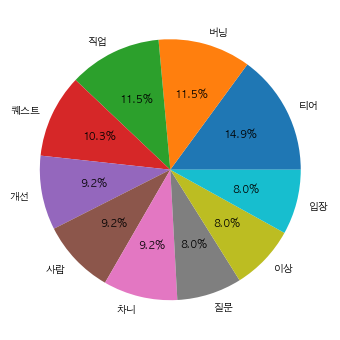

In [190]:
keywords_top = []
freq_top = []
for i in range(10):
    keywords_top.append(c1.most_common(20)[i][0])
    freq_top.append(c1.most_common(20)[i][1])
plt.figure(figsize=(8,6))
plt.pie(freq_top, labels=keywords_top, autopct='%.1f%%')
plt.show()

In [191]:
pd.DataFrame(inven_top.title)

,title
6,대리기사티어표 언제 나온데
128,아 시발 하드보스 3파티로 찢어져있으니까 진짜 좆같네 시벌
629,더시드 근데 보상 편차 좀 줄여줬으면...
671,이루윌 보상이 뭐임?
1184,펫장공 대리작 보통 어떤식으로 함?
...,...
24176,세렌파티에 메르있으면 따로 나로 필요없음?
24452,파티퀘스트 1인이상으로의 입장인원 개선이 필요합니다(feat. 몬스터 컬렉션). 1...
24687,몬컬 상자 보상 불편한 진실
25011,싱글벙글 게이파티.gif


In [ ]:
inven2[inven2['title'].str.contains('사람')]

In [36]:
import numpy as np
import re
import networkx as nx

In [38]:
lines = inven5.title.values

In [46]:
from konlpy.tag import Hannanum
hannanum = Hannanum()

In [ ]:
dataset = []
for i in range(len(lines)):
    dataset.append(hannanum.nouns(re.sub('[^가-힣a-zA-Z0-9\s]','',lines[i])))
    if i % 100 == 0:
        print(str(i)+'번째')

100번째
10100번째
20100번째
30100번째
40100번째
50100번째
60100번째
70100번째
80100번째
90100번째
100100번째
110100번째
120100번째
130100번째
140100번째
150100번째


In [67]:
inven2[inven2['title'].str.contains('사람')]

,comunity,num,title,comments,views,likes,date,url
64,1,8742849,사람이 자기 진면목을 드러내는 게 가진 것 하나 없을 때 만큼이나,0,54,0,09:45,https://www.inven.co.kr/board/maple/2299/87428...
68,1,8742844,본인 전라도 사는데 아침부터 나이많은 사람들 대부분 화나있는거 개웃김 ㅋㅋ,1,194,0,09:44,https://www.inven.co.kr/board/maple/2299/87428...
91,1,8742814,페북 유머저장소 vs 애니프사한 사람들.png,5,278,3,09:36,https://www.inven.co.kr/board/maple/2299/87428...
128,1,8742772,앞으로 5년동안 지겹게 봐야할사람,2,239,0,09:26,https://www.inven.co.kr/board/maple/2299/87427...
156,1,8742739,17~18성 가엔링 쓰는 사람,8,202,0,09:16,https://www.inven.co.kr/board/maple/2299/87427...
...,...,...,...,...,...,...,...,...
24818,1,8698680,버닝2또는이노시스 드라할사람 구함,2,265,0,03-01,https://www.inven.co.kr/board/maple/2299/86986...
24843,1,8698646,혹시 버닝2 드라할사람,0,194,0,03-01,https://www.inven.co.kr/board/maple/2299/86986...
24957,1,8698502,지각이 습관인 사람들의 마인드,5,355,0,03-01,https://www.inven.co.kr/board/maple/2299/86985...
24998,1,8698447,혹시 이래되면 반대하는 사람도 있을까?,6,200,0,03-01,https://www.inven.co.kr/board/maple/2299/86984...


In [195]:
import requests
from bs4 import BeautifulSoup
import pandas as pd

In [205]:
url = 'https://gall.dcinside.com/board/lists/?id=maplestory_new&page=1&list_num=100'
res = requests.get(url)
html_str = res.text
soup = BeautifulSoup(html_str, 'html.parser')
soup

In [203]:
res.__dict__

{'_content': b'',
 '_content_consumed': True,
 '_next': None,
 'status_code': 200,
 'headers': {'Date': 'Thu, 10 Mar 2022 08:53:48 GMT', 'Server': 'Apache', 'Set-Cookie': 'PHPSESSID=b246c3b81373d749be9349aa9d757c48; path=/; domain=.dcinside.com; HttpOnly', 'Vary': 'User-Agent', 'Content-Length': '0', 'Connection': 'close', 'Content-Type': 'text/html; charset=UTF-8'},
 'raw': <urllib3.response.HTTPResponse at 0x7fdb9e23ef40>,
 'url': 'https://gall.dcinside.com/board/lists/?id=maplestory_new&page=1',
 'encoding': 'UTF-8',
 'history': [],
 'reason': 'OK',
 'cookies': <RequestsCookieJar[Cookie(version=0, name='PHPSESSID', value='b246c3b81373d749be9349aa9d757c48', port=None, port_specified=False, domain='.dcinside.com', domain_specified=True, domain_initial_dot=True, path='/', path_specified=True, secure=False, expires=None, discard=True, comment=None, comment_url=None, rest={'HttpOnly': None}, rfc2109=False)]>,
 'elapsed': datetime.timedelta(microseconds=87115),
 'request': <PreparedReques